#  supply chain company: CV Classification    
## Problem Statement
 supply chain company is India's largest fresh produce supply chain company. supply chain company has provided us with a dataset scraped from the web which
contains train and test folders, each having 4 sub-folders with images of onions, potatoes,
tomatoes and some market scenes. We have been tasked with preparing a multiclass
classifier for identifying these vegetables. The dataset provided has all the required images
to achieve the task.   Since the task involves classifying images, we use neural network CNN classifier model

# 1.0 Import  Data & Explore Characteristic

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
cd /content/drive/My Drive/case

/content/drive/My Drive/case


In [ ]:
!unzip  data.zip

Archive:  data.zip
   creating: data/
   creating: data/test/
   creating: data/test/indian market/
  inflating: data/test/indian market/bhl.jpeg  
  inflating: data/test/indian market/bhv.jpeg  
  inflating: data/test/indian market/bn.jpeg  
  inflating: data/test/indian market/hjx.jpeg  
  inflating: data/test/indian market/igis.jpeg  
  inflating: data/test/indian market/in.jpeg  
  inflating: data/test/indian market/india-4898453__340.jpg  
  inflating: data/test/indian market/indian-women-232500__340.jpg  
  inflating: data/test/indian market/indianmarket10.jpeg  
  inflating: data/test/indian market/indianmarket12.jpeg  
  inflating: data/test/indian market/indianmarket13.jpeg  
  inflating: data/test/indian market/indianmarket14.jpeg  
  inflating: data/test/indian market/indianmarket15.jpeg  
  inflating: data/test/indian market/indianmarket18.jpeg  
  inflating: data/test/indian market/indianmarket19.jpeg  
  inflating: data/test/indian market/indianmarket20.jpeg  
  inflating

### Dataset Characteristic
The dataset provided contains train and test folders.   
In **train folder** there are four folders    
 - indian market
 - onion  
 - potato
 - tomato

 In **test folder** ,there are folders for class
 - indian market
 - onion  
 - potato
 - tomato

# 2.0 Exploratory Data Analysis

In [4]:
# Import common libraries
import os
import shutil
import glob
import cv2
import random
import math
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Import tensorflow and its modules
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

tf.keras.utils.set_random_seed(111) # set random seed
# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

In [5]:
# import callbacks
from keras.callbacks import EarlyStopping, ReduceLROnPlateau,TensorBoard
import datetime

%load_ext tensorboard
!rm -rf ./logs/

# 2.1 Class Distribution

In [5]:
# https://medium.com/@sehjadkhoja0/title-exploring-and-analyzing-image-data-with-python-79a7f72f4d2b

def class_info(class_path):
  '''
  process class info:
  get image counts of classes
  '''
  cnt_list=[]
  dir_list = []
  for dirpath, dirnames, filenames in os.walk(class_path):
      print(f"Found {len(filenames)} images in directory: {dirpath}")
      if len(dir_list) == 0:
        dir_list = dirnames
      cnt_list.append(len(filenames))

  cnt_list = cnt_list[1:]
  plt.bar( dir_list, cnt_list)
  plt.ylabel("Number of Images")
  plt.show()

Found 0 images in directory: data/train
Found 599 images in directory: data/train/indian market
Found 849 images in directory: data/train/onion
Found 898 images in directory: data/train/potato
Found 789 images in directory: data/train/tomato


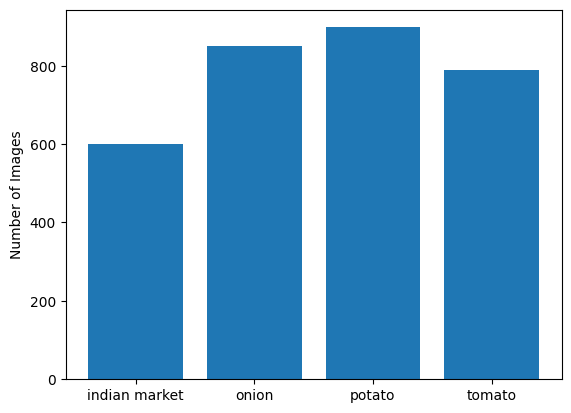

In [6]:
#plot train image counts for all classes
train_path = 'data/train'
class_info(train_path)

Found 0 images in directory: data/test
Found 81 images in directory: data/test/indian market
Found 83 images in directory: data/test/onion
Found 81 images in directory: data/test/potato
Found 106 images in directory: data/test/tomato


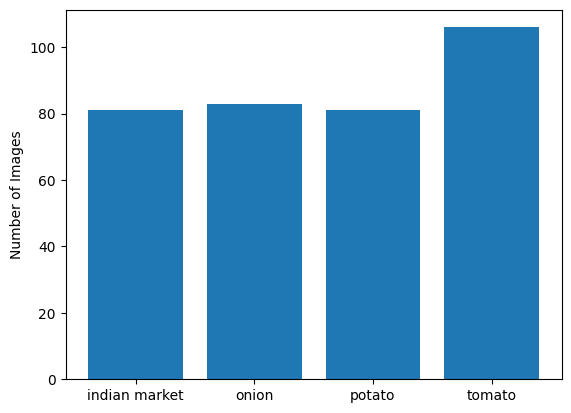

In [7]:
#plot test image counts
test_path = 'data/test'
class_info(test_path)

From the above plots of class dirtibutions we see that image counts are same as mentioned in the documents.
From the class counts for train we see that class labels are nearly equally disrtibuted.  

# 2.2 Image Plots

Found 599 images in directory: data/train/indian market
 image dimensions ht,wdt,chan: (580, 870, 3)


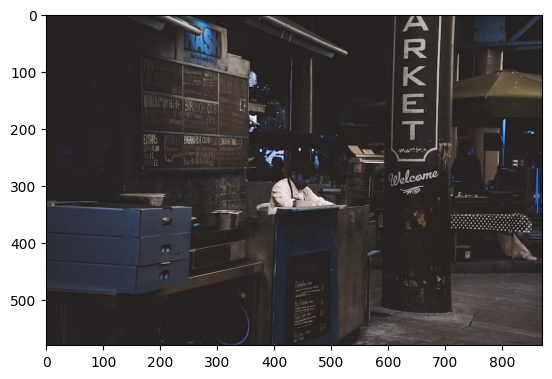

 image dimensions ht,wdt,chan: (100, 100, 3)


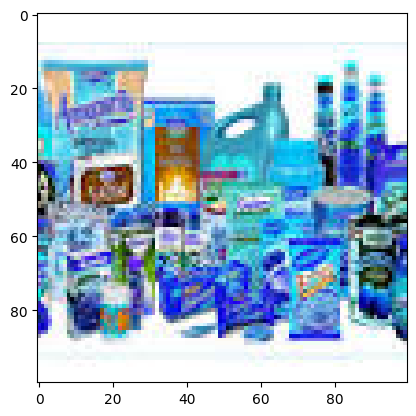

 image dimensions ht,wdt,chan: (151, 335, 3)


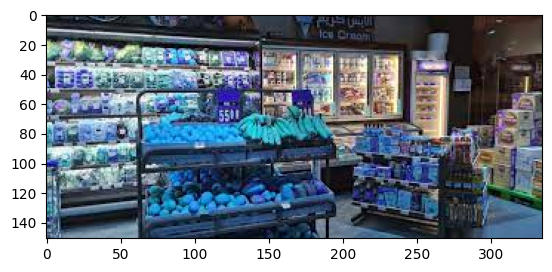

 image dimensions ht,wdt,chan: (580, 870, 3)


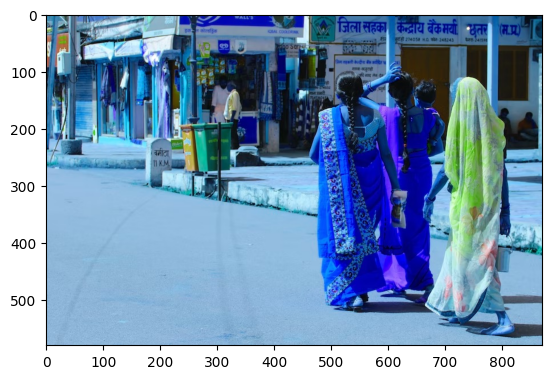

Found 849 images in directory: data/train/onion
 image dimensions ht,wdt,chan: (185, 272, 3)


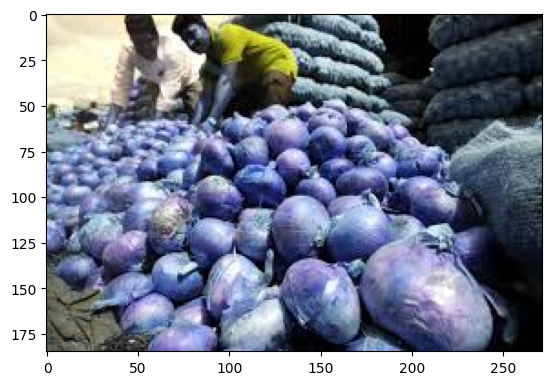

 image dimensions ht,wdt,chan: (1080, 1920, 3)


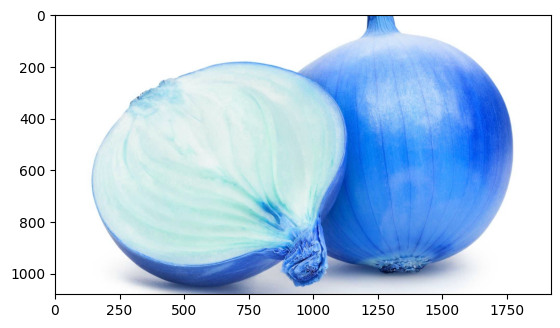

 image dimensions ht,wdt,chan: (425, 640, 3)


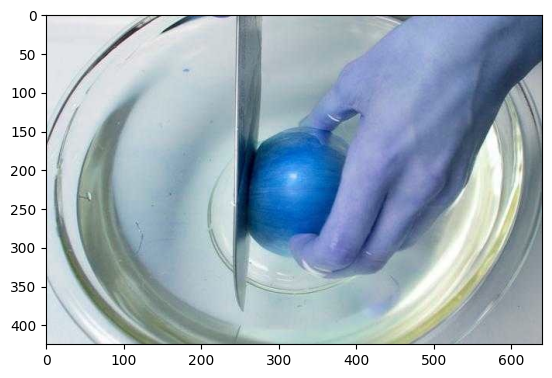

 image dimensions ht,wdt,chan: (327, 640, 3)


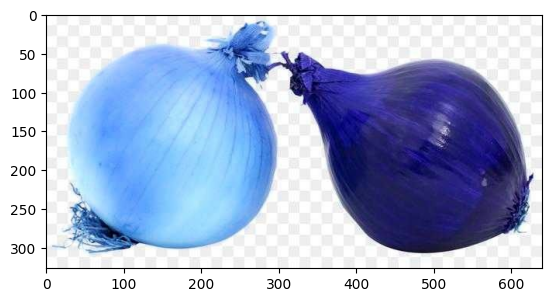

Found 898 images in directory: data/train/potato
 image dimensions ht,wdt,chan: (183, 275, 3)


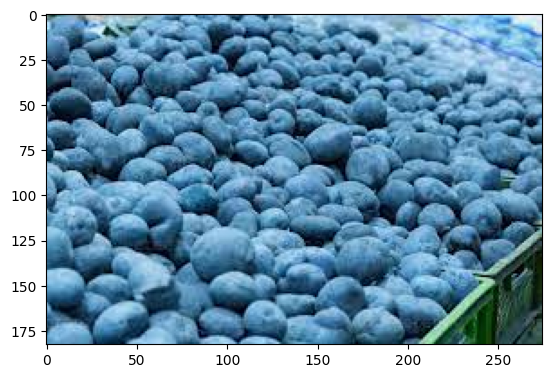

 image dimensions ht,wdt,chan: (183, 276, 3)


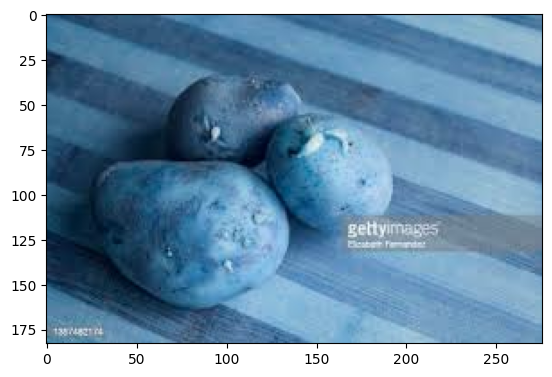

 image dimensions ht,wdt,chan: (100, 100, 3)


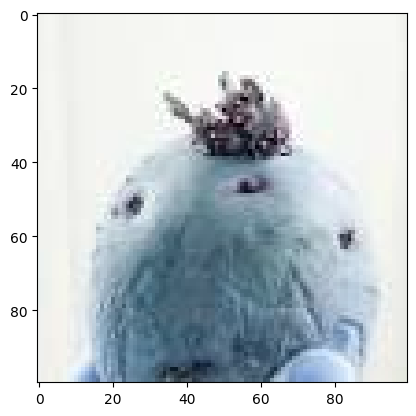

 image dimensions ht,wdt,chan: (318, 159, 3)


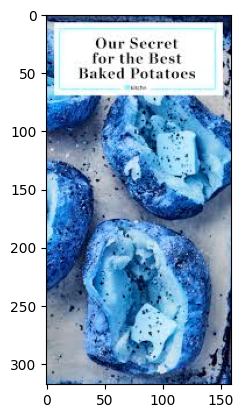

Found 789 images in directory: data/train/tomato
 image dimensions ht,wdt,chan: (500, 400, 3)


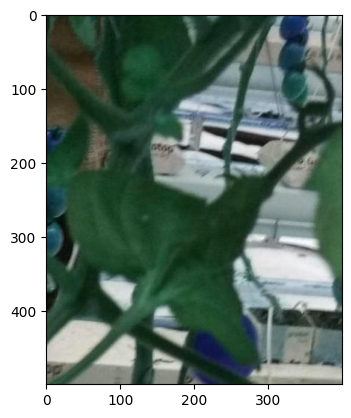

 image dimensions ht,wdt,chan: (400, 500, 3)


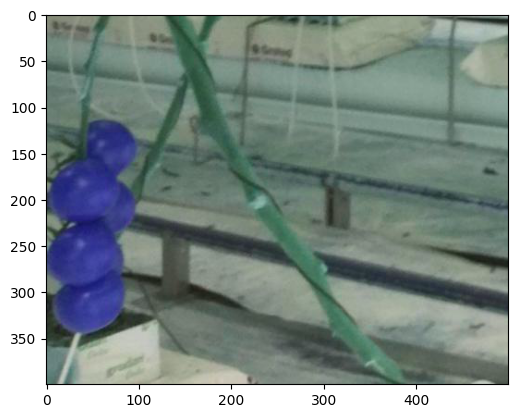

 image dimensions ht,wdt,chan: (500, 400, 3)


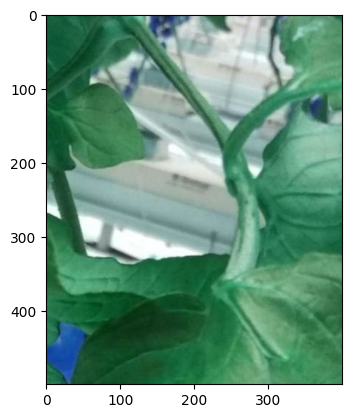

 image dimensions ht,wdt,chan: (500, 400, 3)


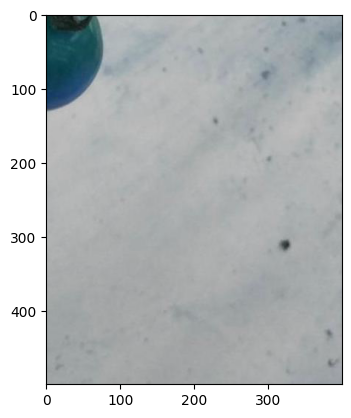

In [8]:
# plot random images from each class
#------------------------------------
image_categories =os.listdir(train_path)

for cat in  image_categories:
  img_path = os.path.join(train_path, cat)
  for dirpath, dirnames, filenames in os.walk(img_path):
    print(f"Found {len(filenames)} images in directory: {img_path}")
    #select 4 random images
    image_ids = np.random.choice(filenames, 4)
    for imag in image_ids:
      imag_path = os.path.join(img_path, imag)
      image = cv2.imread(imag_path)
      height, width, channels = image.shape
      print (f' image dimensions ht,wdt,chan: {height, width, channels}')
      plt.imshow(image)
      plt.show()

From the above random image plots for all classes, we see that images are of different sizes and need to be standardised before feeding them to the model

# 2.2 Splitting train dataset into train and validation  set

In [9]:
def create_val(tr_path,val_path,val_perc):
  '''
  split train data and create validation data
  '''
  image_categories=os.listdir(tr_path)
  if not os.path.exists(val_path):
       os.mkdir(val_path)
  for cat in  image_categories:
    # src,dest paths
    img_path = os.path.join(tr_path, cat)
    dest_path = os.path.join(val_path, cat)
    if not os.path.exists(dest_path):
       os.mkdir(dest_path)
    #
    for dirpath, dirnames, filenames in os.walk(img_path):
      # find number of items for val
      num_of_val = math.floor(len(filenames)*val_perc)
      print(f'creating val folder:{cat}  val count:{num_of_val}')
      image_ids = random.sample(filenames, num_of_val)
      for imag in image_ids:
        imag_path = os.path.join(img_path, imag)
        shutil.move(imag_path, dest_path)

In [10]:
#source path
train_path = './data/train'
#dest path
val_path = './data/val'
#split percent
val_perc = 0.2
#split train and create validation data
create_val(train_path,val_path,val_perc)

creating val folder:indian market  val count:119
creating val folder:onion  val count:169
creating val folder:potato  val count:179
creating val folder:tomato  val count:157


## 2.2.1 Plot class counts after split

Found 0 images in directory: data/train
Found 480 images in directory: data/train/indian market
Found 680 images in directory: data/train/onion
Found 719 images in directory: data/train/potato
Found 632 images in directory: data/train/tomato


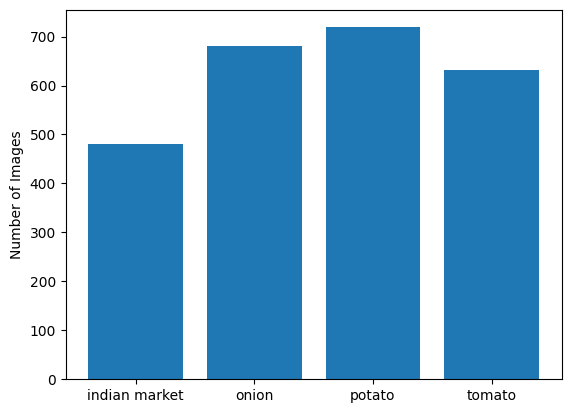

In [11]:
train_path = 'data/train'
class_info(train_path)

Found 0 images in directory: data/val
Found 119 images in directory: data/val/indian market
Found 169 images in directory: data/val/onion
Found 179 images in directory: data/val/potato
Found 157 images in directory: data/val/tomato


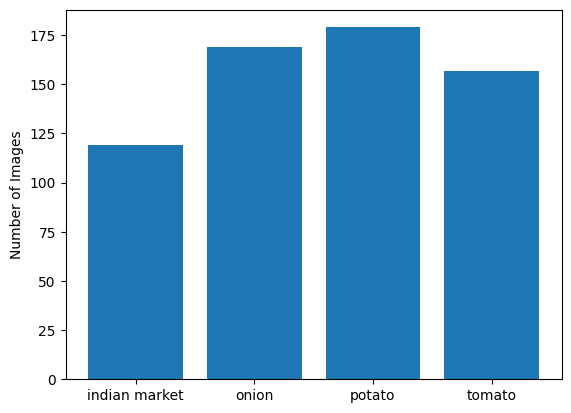

In [12]:
val_path = 'data/val'
class_info(val_path)

So train data is split into train and validation data in ratio 80:20. The split is stratified split done for each class

 # 3.0 Data preprocessing
 ## 3.1 Load Data  

In [6]:
print('\nLoading Train Data...')
train_data = tf.keras.utils.image_dataset_from_directory(
'data/train', shuffle = True,label_mode='categorical'
)
class_names = train_data.class_names

print('\nLoading Validation Data...')
val_data = tf.keras.utils.image_dataset_from_directory(
'data/val', shuffle = False,label_mode='categorical'
)

print('\nLoading Test Data...')
test_data = tf.keras.utils.image_dataset_from_directory(
'data/test', shuffle = False,label_mode='categorical'
)


Loading Train Data...
Found 2511 files belonging to 4 classes.

Loading Validation Data...
Found 624 files belonging to 4 classes.

Loading Test Data...
Found 351 files belonging to 4 classes.


## 3.2 Image Preprocessing   
### 3.2.1 Resize & Rescale images

In [7]:
height, width = 224, 224

# Data Processing Stage with resizing and rescaling operations
#source: cv course notes
data_preprocess = keras.Sequential(
name="data_preprocess",
layers=[
layers.Resizing(height, width),  # Shape Preprocessing
layers.Rescaling(1.0/255)   # Value Preprocessing
 ])

# Perform Data Processing on the train, val, test dataset
train_ds = train_data.map(lambda x, y: (data_preprocess(x), y))
val_ds = val_data.map(lambda x, y: (data_preprocess(x), y))
test_ds = test_data.map(lambda x, y: (data_preprocess(x), y))

# 4.0 Create CNN    

### 4.0.0 Create CNN model from scratch

In [15]:
def arch_1(height=224, width=224):
  num_classes = 4
  hidden_size1 = 1024
  hidden_size2 = 512
  model = keras.Sequential(
  name="model_cnn_1",
  layers=[
  layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu',
                input_shape=(height, width, 3)),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
  layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=512, kernel_size=3, padding="same", activation='relu'),
  layers.Conv2D(filters=512, kernel_size=3, padding="same", activation='relu'),
  layers.GlobalAveragePooling2D(),
  layers.Dense(units=hidden_size1, activation='relu'),
  layers.Dense(units=hidden_size2, activation='relu'),
  layers.Dense(units=num_classes, activation='softmax')
  ])
  return model

model = arch_1()
model.summary()

Model: "model_cnn_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 14, 14, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 14, 14, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 7, 7, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 7, 7, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 7, 7, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,579,876 (21.29 MB)

 Trainable params: 5,579,876 (21.29 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
model.compile(optimizer='adam',
  loss='categorical_crossentropy',
  metrics=['accuracy'])

In [18]:
# checkpoint
filepath="weights-improvement-{epoch:02d}-{val_accuracy:.2f}.keras"

#train model
model_fit = model.fit(train_ds, validation_data=val_ds, epochs=10,batch_size=64,
  callbacks=[
  keras.callbacks.ModelCheckpoint(filepath, verbose=1,
  monitor='val_accuracy', mode='max', save_best_only=True)])

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.3401 - loss: 1.3340 
Epoch 1: val_accuracy improved from -inf to 0.53205, saving model to weights-improvement-01-0.53.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 1100s 14s/step - accuracy: 0.3410 - loss: 1.3326 - val_accuracy: 0.5321 - val_loss: 0.9086
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.5163 - loss: 0.9259
Epoch 2: val_accuracy improved from 0.53205 to 0.57532, saving model to weights-improvement-02-0.58.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - accuracy: 0.5166 - loss: 0.9258 - val_accuracy: 0.5753 - val_loss: 0.7930
Epoch 3/10
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.6301 - loss: 0.7432
Epoch 3: val_accuracy improved from 0.57532 to 0.66667, saving model to weights-improvement-03-0.67.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - accuracy: 0.6301 - loss: 0.7432 - val_accuracy: 0.6667 - val_loss: 0.7327
Epoch 4/10
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.6631 - l

In [11]:
# helper function to annotate maximum values in the plots
#source: Scaler cv notes
#-----------------------------------------------
def annot_max(x,y, xytext=(0.94,0.96), ax=None, only_y=True):
  xmax = x[np.argmax(y)]
  ymax = max(y)
  if only_y:
     text = "{:.2f}%".format(ymax)
  else:
     text= "x={:.2f}, y={:.2f}%".format(xmax, ymax)
  if not ax:
     ax=plt.gca()
  bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
  arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,\
     angleB=60")
  kw = dict(xycoords='data',textcoords="axes fraction",
  arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
  ax.annotate(text, xy=(xmax, ymax), xytext=xytext, **kw)

def plot_accuracy(model_fit):
  #accuracy graph
  x = range(0,len(model_fit.history['accuracy']))
  y_train = [acc * 100 for acc in model_fit.history['accuracy']]
  y_val = [acc * 100 for acc in model_fit.history['val_accuracy']]
  plt.plot(x, y_train, label='Train', color='b')
  annot_max(x, y_train, xytext=(0.7,0.9))
  plt.plot(x, y_val, label='Val', color='r')
  annot_max(x, y_val, xytext=(0.8,0.7))
  plt.ylabel('Accuracy', fontsize=15)
  plt.xlabel('epoch', fontsize=15)
  plt.legend()
  plt.show()

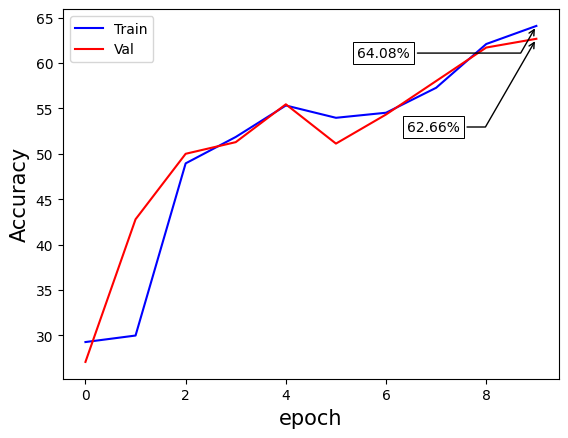

In [ ]:
plot_accuracy(model_fit)

In [12]:
# helper function for accuracy,confusion matrix
#source: Scaler cv notes
#-----------------------
def print_accuracy_stats(model, ds, class_names):
  true_onehot = tf.concat([y for x, y in ds], axis=0)
  true_categories = tf.argmax(true_onehot, axis=1)
  y_pred = model.predict(ds)
  predicted_categories = tf.argmax(y_pred, axis=1)
  test_acc = metrics.accuracy_score(true_categories,
                     predicted_categories) * 100
  print(f'\nTest Accuracy: {test_acc:.2f}%\n')
  # Note: This doesn't work with shuffled datasets


def plot_confusion_matrix(model, ds, class_names):
  true_onehot = tf.concat([y for x, y in ds], axis=0)
  true_categories = tf.argmax(true_onehot, axis=1)
  y_pred = model.predict(ds)
  predicted_categories = tf.argmax(y_pred, axis=1)
  cm = metrics.confusion_matrix(true_categories,predicted_categories) # last batch
  sns.heatmap(cm, annot=True, xticklabels=class_names,
              yticklabels=class_names, cmap="YlGnBu", fmt='g')
  plt.show()

11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 386ms/step

Test Accuracy: 67.52%

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step


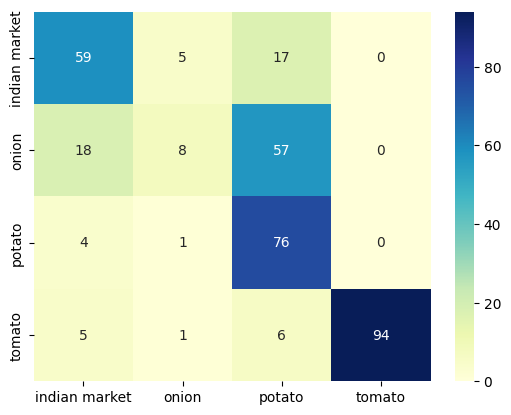

In [21]:
print_accuracy_stats(model, test_ds, class_names)
plot_confusion_matrix(model, test_ds, class_names)

## 4.1  Add BN ,Dropout ,Callbacks to CNN model  
### 4.1.0 Improve model performance

In [22]:
def arch_2(height=224, width=224):
  num_classes = 4
  hidden_size1 = 1024
  hidden_size2 = 512
  model = keras.Sequential(
  name="model_cnn_1",
  layers=[
  layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu',
                input_shape=(height, width, 3)),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=512, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.Conv2D(filters=512, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.GlobalAveragePooling2D(),
  layers.Dense(units=hidden_size1, activation='relu'),
  layers.Dropout(0.5),
  layers.Dense(units=hidden_size2, activation='relu'),
  layers.Dropout(0.5),
  layers.Dense(units=num_classes, activation='softmax')
  ])
  return model



In [23]:
model2 = arch_2()
model2.summary()

model2.compile(optimizer='adam',
  loss='categorical_crossentropy',
  metrics=['accuracy'])

Model: "model_cnn_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 112, 112, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 56, 56, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 14, 14, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 14, 14, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 14, 14, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 14, 14, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 7, 7, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 7, 7, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 5,587,044 (21.31 MB)

 Trainable params: 5,583,460 (21.30 MB)

 Non-trainable params: 3,584 (14.00 KB)

In [13]:
## create callbacks
call_lr = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=3,
                                            verbose=1,
                                            factor=0.7,
                                            min_lr=0.00001)

call_es = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=5)

logdir = "logs/model_fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
call_tb = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# checkpoint
filepath="weights-improvement-{epoch:02d}-{val_accuracy:.2f}.keras"
call_mb =  keras.callbacks.ModelCheckpoint(filepath, verbose=1,
  monitor='val_accuracy', mode='max', save_best_only=True)

In [25]:
model_fit = model2.fit(train_ds, validation_data=val_ds, epochs=50,batch_size=64,
  callbacks=[call_lr, call_es, call_mb, call_tb])

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.5974 - loss: 1.0977
Epoch 1: val_accuracy improved from -inf to 0.29487, saving model to weights-improvement-01-0.29.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 41s 369ms/step - accuracy: 0.5982 - loss: 1.0956 - val_accuracy: 0.2949 - val_loss: 1.7472 - learning_rate: 0.0010
Epoch 2/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.7773 - loss: 0.6237
Epoch 2: val_accuracy did not improve from 0.29487
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - accuracy: 0.7773 - loss: 0.6233 - val_accuracy: 0.2516 - val_loss: 13.7411 - learning_rate: 0.0010
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.7914 - loss: 0.5716
Epoch 3: val_accuracy improved from 0.29487 to 0.32051, saving model to weights-improvement-03-0.32.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - accuracy: 0.7913 - loss: 0.5718 - val_accuracy: 0.3205 - val_loss: 6.6608 - learning_rate: 0.0010
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - a

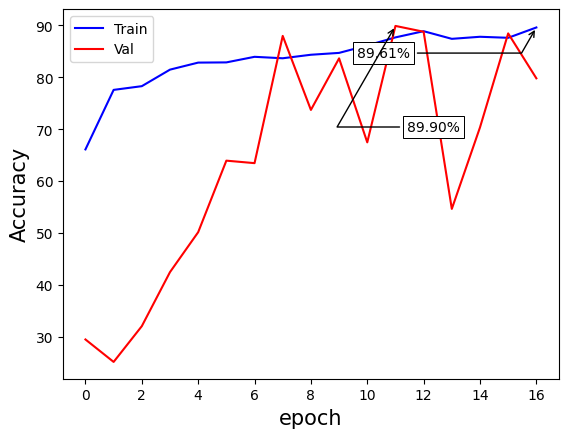

In [26]:
plot_accuracy(model_fit)

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step

Test Accuracy: 82.34%

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step


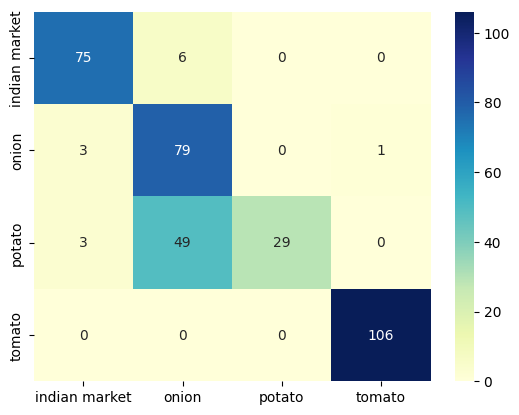

In [27]:
print_accuracy_stats(model2, test_ds, class_names)
plot_confusion_matrix(model2, test_ds, class_names)

In [28]:
 #https://www.machinelearningnuggets.com/tensorboard-tutorial/
 %tensorboard --logdir logs

<IPython.core.display.Javascript object>

### 4.1.1 Summary
   Adding Batch Normalization,Dropout has improved model performance.Callbacks help to fine tune and monitor model training.

## 4.2 Data Augmentation

In [10]:
def arch_3(height=224, width=224):
  '''
  data augmentation
  https://colab.research.google.com/github/tensorflow/docs/blob/snapshot-keras/site/en/guide/keras/preprocessing_layers.ipynb
  '''
  num_classes = 4
  hidden_size1 = 1024
  hidden_size2 = 512
  model = keras.Sequential(
  name="model_cnn_3",
  layers=[
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(0.2),
  layers.RandomContrast(0.2),
  layers.RandomTranslation(0.2, 0.2),
  layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu',
                input_shape=(height, width, 3)),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(filters=512, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.Conv2D(filters=512, kernel_size=3, padding="same", activation='relu'),
  layers.BatchNormalization(),
  layers.GlobalAveragePooling2D(),
  layers.Dense(units=hidden_size1, activation='relu'),
  layers.Dropout(0.5),
  layers.Dense(units=hidden_size2, activation='relu'),
  layers.Dropout(0.5),
  layers.Dense(units=num_classes, activation='softmax')
  ])
  return model

In [14]:
model3 = arch_3()

call_lr2 = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=4,
                                            verbose=1,
                                            factor=0.7,
                                            min_lr=0.00001)

call_es2 = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=10)

model3.compile(optimizer='adam',
  loss='categorical_crossentropy',
  metrics=['accuracy'])

In [15]:
model_fit = model3.fit(train_ds, validation_data=val_ds, epochs=50,batch_size=64,
  callbacks=[call_lr2, call_es2, call_mb])

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.6232 - loss: 1.0817
Epoch 1: val_accuracy improved from -inf to 0.25160, saving model to weights-improvement-01-0.25.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 39s 286ms/step - accuracy: 0.6238 - loss: 1.0797 - val_accuracy: 0.2516 - val_loss: 3.6370 - learning_rate: 0.0010
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - accuracy: 0.7236 - loss: 0.7467
Epoch 2: val_accuracy improved from 0.25160 to 0.26122, saving model to weights-improvement-02-0.26.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 34s 275ms/step - accuracy: 0.7238 - loss: 0.7462 - val_accuracy: 0.2612 - val_loss: 5.0736 - learning_rate: 0.0010
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.7640 - loss: 0.6519
Epoch 3: val_accuracy improved from 0.26122 to 0.49199, saving model to weights-improvement-03-0.49.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 277ms/step - accuracy: 0.7641 - loss: 0.6519 - val_accuracy: 0.4920 - val_loss: 1.8559 - learning_rate: 0.0010
E

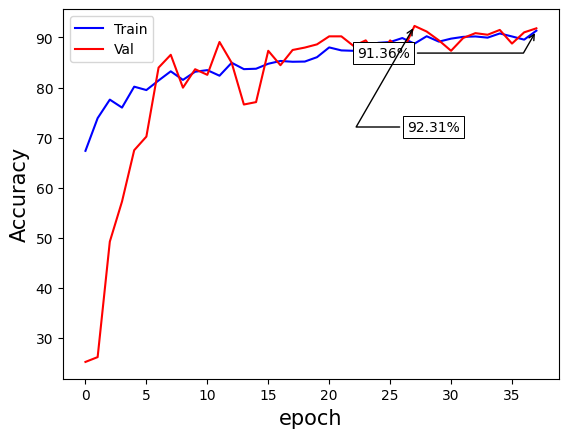

In [16]:
plot_accuracy(model_fit)

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 208ms/step

Test Accuracy: 88.89%

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step


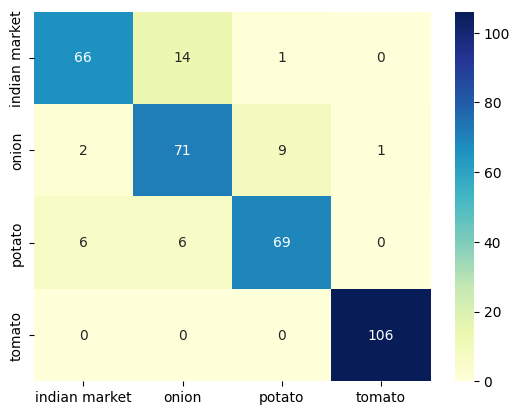

In [17]:
print_accuracy_stats(model3, test_ds, class_names)
plot_confusion_matrix(model3, test_ds, class_names)

### 4.2.1 Summary
Using data Augmentation improves model performance.  Misclassied count  in confusion matrix has decreased.    
Note : image data augmentation layers are only active during training (similarly to the Dropout layer).     
https://keras.io/guides/preprocessing_layers/#available-preprocessing

# 5.0 Pre-Trained Models (VGG16)

## 5.1 Transfer Learning

In [14]:
 #create model using vgg16
 num_classes = 4
 height=224
 width=224
 base_model = keras.applications.VGG16(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(224, 224, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.
base_model.trainable = False
x = layers.GlobalMaxPooling2D()(base_model.output)
x = layers.Dense(2048, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
output = layers.Dense(num_classes, activation='softmax')(x)
model_vgg = keras.Model(base_model.input, output)


In [15]:
model_vgg.compile(optimizer='adam',
  loss='categorical_crossentropy',
  metrics=['accuracy'])

In [16]:
hist_vgg = model_vgg.fit(train_ds, validation_data=val_ds, epochs=50,batch_size=64,
  callbacks=[call_lr, call_es, call_mb])

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - accuracy: 0.5912 - loss: 1.1356
Epoch 1: val_accuracy improved from -inf to 0.82372, saving model to weights-improvement-01-0.82.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 62s 594ms/step - accuracy: 0.5927 - loss: 1.1311 - val_accuracy: 0.8237 - val_loss: 0.4116 - learning_rate: 0.0010
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.8097 - loss: 0.4395
Epoch 2: val_accuracy improved from 0.82372 to 0.85737, saving model to weights-improvement-02-0.86.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 44s 289ms/step - accuracy: 0.8098 - loss: 0.4394 - val_accuracy: 0.8574 - val_loss: 0.3433 - learning_rate: 0.0010
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - accuracy: 0.8555 - loss: 0.3917
Epoch 3: val_accuracy improved from 0.85737 to 0.86378, saving model to weights-improvement-03-0.86.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 278ms/step - accuracy: 0.8554 - loss: 0.3917 - val_accuracy: 0.8638 - val_loss: 0.3348 - learning_rate: 0.0010
E

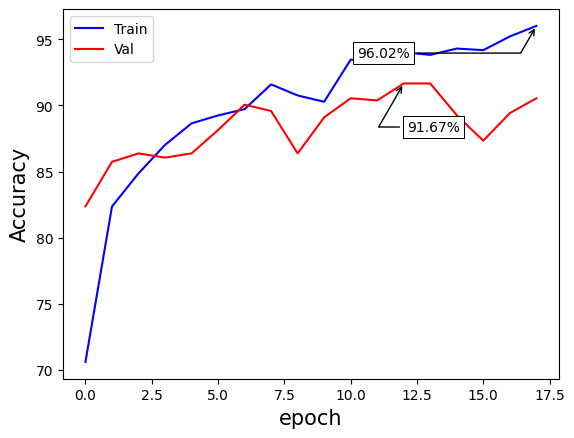

In [17]:
plot_accuracy(hist_vgg)

11/11 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step

Test Accuracy: 86.89%

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step


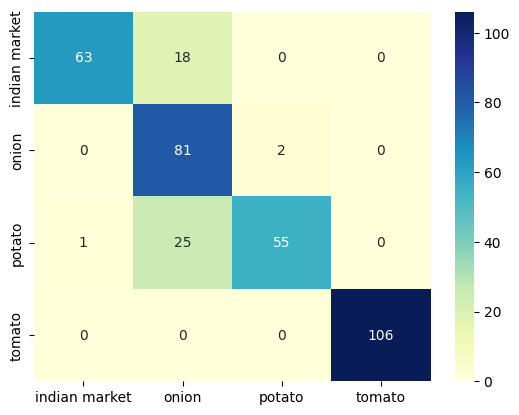

In [18]:
print_accuracy_stats(model_vgg, test_ds, class_names)
plot_confusion_matrix(model_vgg, test_ds, class_names)

### 5.1.1 Summary   
  Using tranfer Learning is an useful method to quickly create models instead of training models from scratch. The model performance will also be good.

## 5.2 Fine Tuning of Model

In [19]:
#https://keras.io/guides/transfer_learning/
# Unfreeze the base model
base_model.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are take into account
model_vgg.compile(optimizer=keras.optimizers.Adam(1e-5),  # Very low learning rate
              loss='categorical_crossentropy',
               metrics=['accuracy'])


In [20]:
# Train end-to-end. Be careful to stop before you overfit!
hist_vgg2 = model_vgg.fit(train_ds, validation_data=val_ds, epochs=20,batch_size=64,
  callbacks=[call_lr, call_es, call_mb])

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 852ms/step - accuracy: 0.9531 - loss: 0.1192
Epoch 1: val_accuracy improved from 0.91667 to 0.91987, saving model to weights-improvement-01-0.92.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 121s 960ms/step - accuracy: 0.9531 - loss: 0.1190 - val_accuracy: 0.9199 - val_loss: 0.2652 - learning_rate: 1.0000e-05
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 514ms/step - accuracy: 0.9761 - loss: 0.0594
Epoch 2: val_accuracy improved from 0.91987 to 0.93269, saving model to weights-improvement-02-0.93.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 48s 590ms/step - accuracy: 0.9762 - loss: 0.0594 - val_accuracy: 0.9327 - val_loss: 0.2132 - learning_rate: 1.0000e-05
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.9863 - loss: 0.0414
Epoch 3: val_accuracy improved from 0.93269 to 0.94391, saving model to weights-improvement-03-0.94.keras
79/79 ━━━━━━━━━━━━━━━━━━━━ 47s 589ms/step - accuracy: 0.9863 - loss: 0.0413 - val_accuracy: 0.9439 - val_loss: 0.1902 - learning_ra

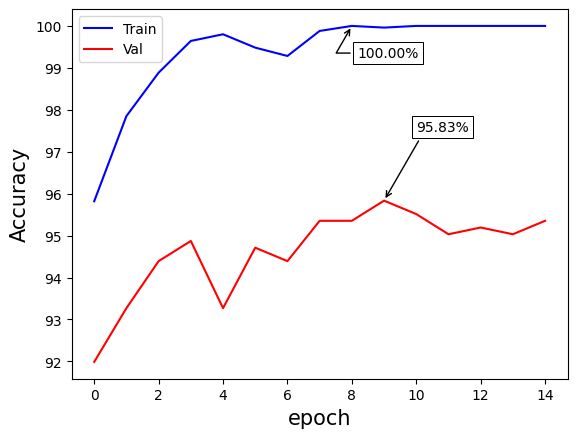

In [21]:
 plot_accuracy(hist_vgg2)

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step

Test Accuracy: 91.45%

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step


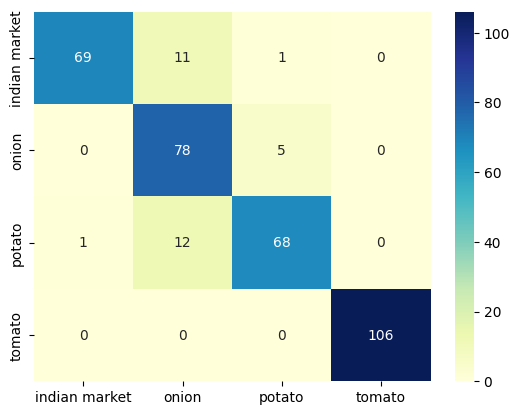

In [22]:
print_accuracy_stats(model_vgg, test_ds, class_names)
plot_confusion_matrix(model_vgg, test_ds, class_names)

### 5.2.1 Summary   
  Fine tuning has further improved model performance. This can be enhanced further using data augmentation.

# 6.0 Use Best Model  

## 6.1 Load Best Model and check test performance

In [24]:
from keras.models import load_model
#load best model created while fine tuning VGG
best_model = load_model('weights-improvement-10-0.96.keras')

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step

Test Accuracy: 92.31%

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step


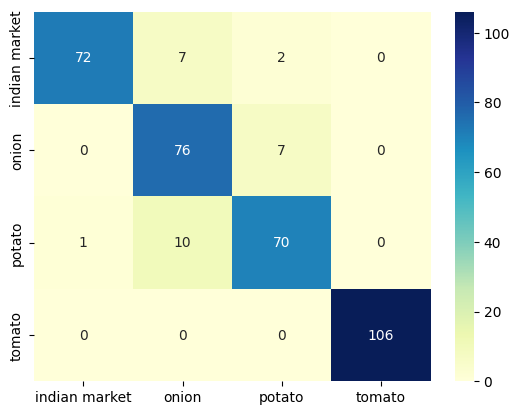

In [25]:
print_accuracy_stats(best_model, test_ds, class_names)
plot_confusion_matrix(best_model, test_ds, class_names)

### 6.1.1 Summary   
  The best model has very good test accuracy and confusion matrix shows  that most of the test data is classified correctly with very few errors

# 7.0 Summary   
- Transfer learning is useful when you do not possess a large amount of data.    
- Fine-Tuning pre-trained layers can boost model performance significantly   
- Batch Normalization,Dropout are regulariztion mentods to boost performance   
- Data Augmentation is useful to  improve performance

## 7.1 Test Performance   
The performance of the models on test data are as follows:
- Baseline Model ==> Test Accuracy: 67.52%
- Baseline Model with BN,Dropout,CAllbacks==> Test Accuracy:  82.34%
- Baseline Model with BN,Dropout,CAllbacks + Data Augmentation ==> Test Accuracy: 88.89%  
- Transfer learning using VGG16 ==> Test Accuracy: 86.89%
- Trans fer learning using VGG16 + finetuning ==> Test Accuracy: 91.45%
- Best Model ==> Test Accuracy: 92.31%